In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns


In [2]:
df=pd.read_csv('Life-Expectancy-Data-Updated.csv')
df=pd.DataFrame(df)

3. Simple data preprocessing

In [3]:
df.head()  #Displays the first 5 rows of the data

,Country,Region,Year,Infant_deaths,Under_five_deaths,Adult_mortality,Alcohol_consumption,Hepatitis_B,Measles,BMI,...,Diphtheria,Incidents_HIV,GDP_per_capita,Population_mln,Thinness_ten_nineteen_years,Thinness_five_nine_years,Schooling,Economy_status_Developed,Economy_status_Developing,Life_expectancy
0,Turkiye,Middle East,2015,11.1,13.0,105.8240,1.32,97,65,27.8,...,97,0.08,11006,78.53,4.9,4.8,7.8,0,1,76.5
1,Spain,European Union,2015,2.7,3.3,57.9025,10.35,97,94,26.0,...,97,0.09,25742,46.44,0.6,0.5,9.7,1,0,82.8
2,India,Asia,2007,51.5,67.9,201.0765,1.57,60,35,21.2,...,64,0.13,1076,1183.21,27.1,28.0,5.0,0,1,65.4
3,Guyana,South America,2006,32.8,40.5,222.1965,5.68,93,74,25.3,...,93,0.79,4146,0.75,5.7,5.5,7.9,0,1,67.0
4,Israel,Middle East,2012,3.4,4.3,57.9510,2.89,97,89,27.0,...,94,0.08,33995,7.91,1.2,1.1,12.8,1,0,81.7


In [4]:
df.info() #Provides information about the types of data in the columns

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2864 entries, 0 to 2863
Data columns (total 21 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   Country                      2864 non-null   object 
 1   Region                       2864 non-null   object 
 2   Year                         2864 non-null   int64  
 3   Infant_deaths                2864 non-null   float64
 4   Under_five_deaths            2864 non-null   float64
 5   Adult_mortality              2864 non-null   float64
 6   Alcohol_consumption          2864 non-null   float64
 7   Hepatitis_B                  2864 non-null   int64  
 8   Measles                      2864 non-null   int64  
 9   BMI                          2864 non-null   float64
 10  Polio                        2864 non-null   int64  
 11  Diphtheria                   2864 non-null   int64  
 12  Incidents_HIV                2864 non-null   float64
 13  GDP_per_capita    

In [5]:
df.isnull().sum() #shows whether there is any null values in the dataset


Country                        0
Region                         0
Year                           0
Infant_deaths                  0
Under_five_deaths              0
Adult_mortality                0
Alcohol_consumption            0
Hepatitis_B                    0
Measles                        0
BMI                            0
Polio                          0
Diphtheria                     0
Incidents_HIV                  0
GDP_per_capita                 0
Population_mln                 0
Thinness_ten_nineteen_years    0
Thinness_five_nine_years       0
Schooling                      0
Economy_status_Developed       0
Economy_status_Developing      0
Life_expectancy                0
dtype: int64

In [6]:
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
df['Country'] = le.fit_transform(df['Country'])
df['Region'] = le.fit_transform(df['Region'])
print(df.head())

   Country  Region  Year  Infant_deaths  Under_five_deaths  Adult_mortality  \
0      164       4  2015           11.1               13.0         105.8240   
1      148       3  2015            2.7                3.3          57.9025   
2       74       1  2007           51.5               67.9         201.0765   
3       69       8  2006           32.8               40.5         222.1965   
4       79       4  2012            3.4                4.3          57.9510   

   Alcohol_consumption  Hepatitis_B  Measles   BMI  ...  Diphtheria  \
0                 1.32           97       65  27.8  ...          97   
1                10.35           97       94  26.0  ...          97   
2                 1.57           60       35  21.2  ...          64   
3                 5.68           93       74  25.3  ...          93   
4                 2.89           97       89  27.0  ...          94   

   Incidents_HIV  GDP_per_capita  Population_mln  Thinness_ten_nineteen_years  \
0           0.08 

4. Data Visualization

Data is visualised using pairplots and correlation heatmaps in the seeaborn library.

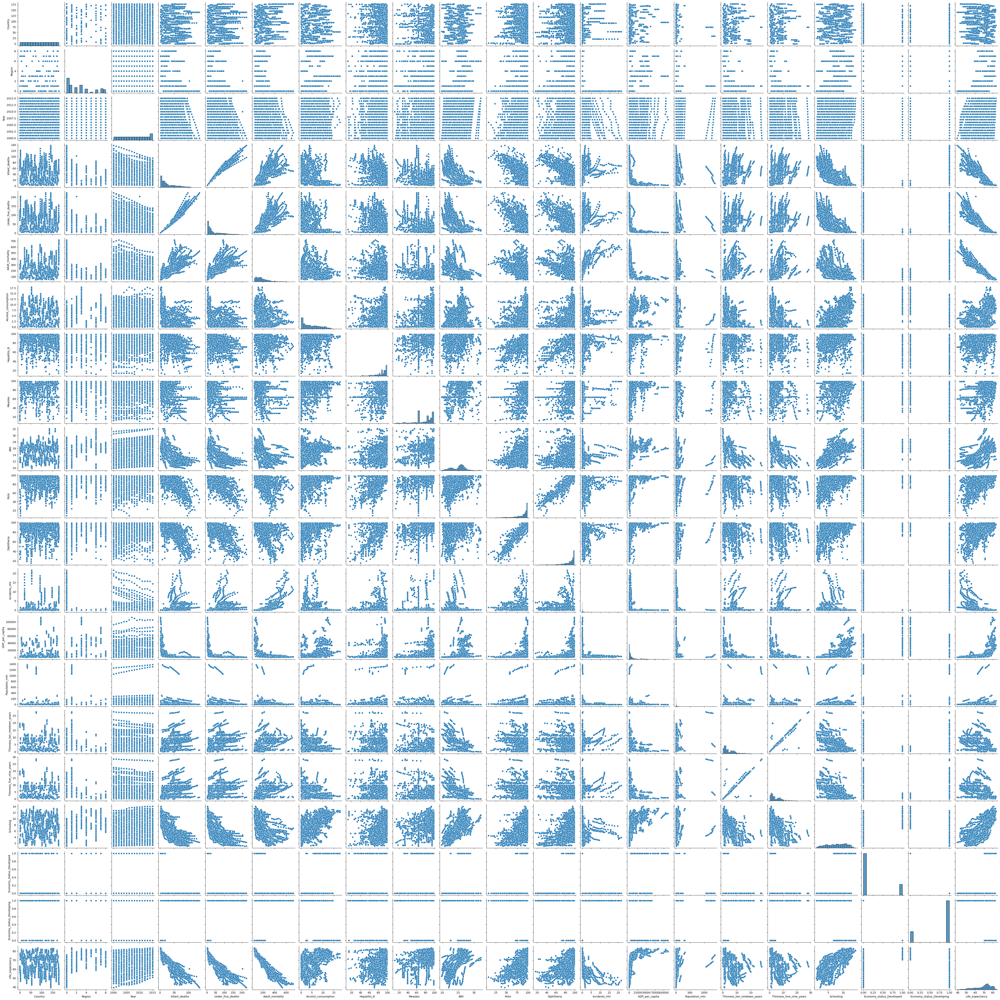

In [7]:
sns.pairplot(df) #pairplot in seaborn libary

<AxesSubplot: >

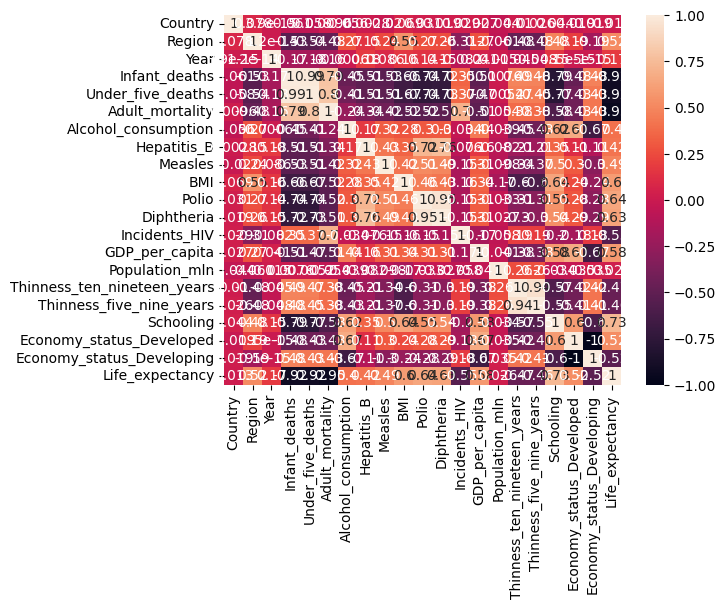

In [8]:
corr=df.corr() #correlation heatmap in seaborn library
sns.heatmap(corr,annot=True)

5. Building a model to predict the Life Expectancy

Here, Random Forest Regressor can be used as it provides the best accuracy among regression models.

In [9]:
from sklearn.ensemble import RandomForestRegressor #Uses random forest regression
from sklearn.model_selection import train_test_split #Splits the dataset into testing and trainig parts
from sklearn.metrics import mean_squared_error #Finds the accuracy of the prediction model

In [10]:
X=df.drop(['Life_expectancy',],axis=1)
y=df['Life_expectancy']
X_train, X_test, y_train, y_test = train_test_split(X ,y, test_size=0.4, random_state=101)

In [11]:
rf = RandomForestRegressor(n_estimators=100,oob_score=True, random_state=101)

In [12]:
rf.fit(X_train,y_train)

RandomForestRegressor(oob_score=True, random_state=101)

In [13]:
y_pred = rf.predict(X_test)

In [14]:
mse = mean_squared_error(y_test, y_pred)
print("Mean Squared Error:", mse)

Mean Squared Error: 0.5499284650959851


In [15]:
from sklearn.metrics import r2_score
score = r2_score(y_test, y_pred)
print(score)

0.9936836434563786


In [17]:
accuracy = []
for i in range(1, 101):
    rf.set_params(n_estimators=i)
    rf.fit(X_train, y_train)
    accuracy.append(rf.score(X_test, y_test))

c:\Users\Rohit.LAPTOP-PHGLVP9F\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\ensemble\_forest.py:586: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable OOB estimates.
  warn(
c:\Users\Rohit.LAPTOP-PHGLVP9F\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\ensemble\_forest.py:586: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable OOB estimates.
  warn(
c:\Users\Rohit.LAPTOP-PHGLVP9F\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\ensemble\_forest.py:586: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable OOB estimates.
  warn(
c:\Users\Rohit.LAPTOP-PHGLVP9F\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\ensemble\_forest.py:586: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used

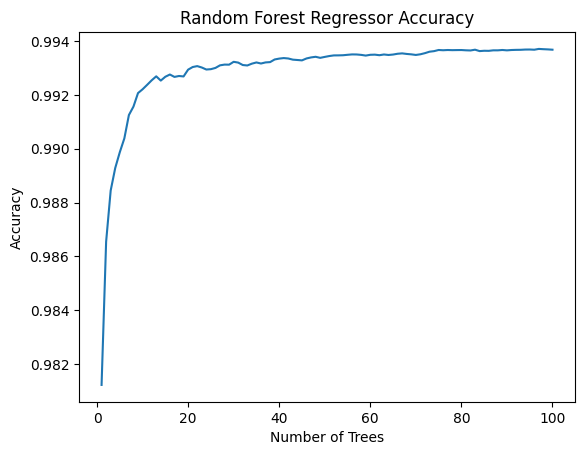

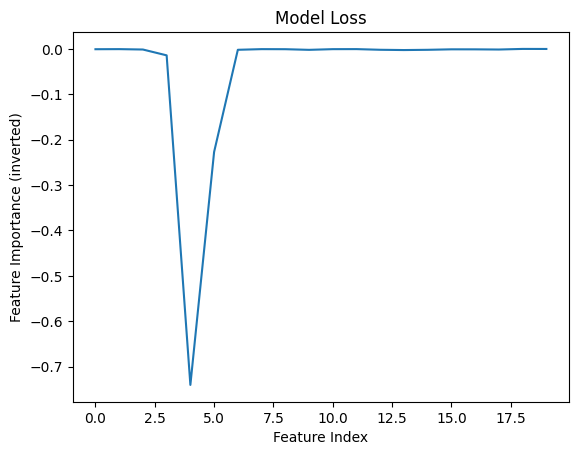

In [18]:
oob_score = rf.oob_score_
feat_importances = rf.feature_importances_
# Plot the training and validation accuracy
plt.plot(range(1, 101), accuracy)
plt.xlabel('Number of Trees')
plt.ylabel('Accuracy')
plt.title('Random Forest Regressor Accuracy')
plt.show()

# Plot the training and validation loss (inverted feature importances)
plt.plot(feat_importances * -1)
plt.title('Model Loss')
plt.ylabel('Feature Importance (inverted)')
plt.xlabel('Feature Index')
plt.show()
